In [2]:
# import pandas as pd
from pandas_profiling import ProfileReport

# import matplotlib.pyplot as plt
# import numpy as mp 
from sklearn.metrics import mean_absolute_error

from pdpbox.pdp import pdp_isolate, pdp_plot, pdp_interact, pdp_interact_plot

import shap


# data analysis and wrangling
import pandas as pd
import numpy as np

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# validation
from sklearn.model_selection import train_test_split

# encoders
from category_encoders import OneHotEncoder, OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, roc_auc_score

# pipeline
from sklearn.pipeline import make_pipeline

# machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestRegressor

from sklearn.linear_model import LinearRegression


# Boosted Models
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier

from xgboost import XGBRegressor

# Displaying images in code cell output
from IPython.display import Image
from IPython.core.display import HTML 

# Permutation Importance
from sklearn.inspection import permutation_importance

**EDA**

In [3]:
df = pd.read_csv('/Users/ike/Documents/Personal Stuff  /Lambda 6.21.21/Unit 2 Flex/U2FW3 9.11.21/Built week Dataset 9.11.21/archive/cwurData.csv')

In [3]:
df.head()

,world_rank,institution,country,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,broad_impact,patents,score,year
0,1,Harvard University,USA,1,7,9,1,1,1,1,NaN,5,100.00,2012
1,2,Massachusetts Institute of Technology,USA,2,9,17,3,12,4,4,NaN,1,91.67,2012
2,3,Stanford University,USA,3,17,11,5,4,2,2,NaN,15,89.50,2012
3,4,University of Cambridge,United Kingdom,1,10,24,4,16,16,11,NaN,50,86.17,2012
4,5,California Institute of Technology,USA,4,2,29,7,37,22,22,NaN,18,85.21,2012


In [4]:
df.shape

(2200, 14)

In [5]:
report  = ProfileReport(df).to_notebook_iframe()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

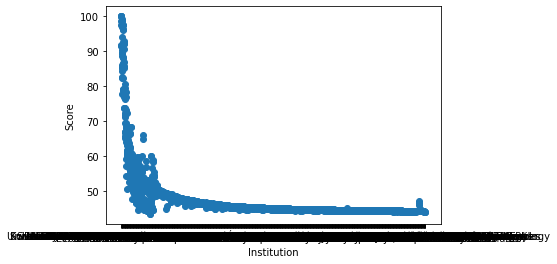

In [6]:
#Checking for outlier on score feature, scatter plot
 

plt.scatter(df['institution'], df['score'])
plt.xlabel('Institution')
plt.ylabel('Score')
plt.show()

In [8]:
df.head(1)

,world_rank,institution,country,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,broad_impact,patents,score,year
0,1,Harvard University,USA,1,7,9,1,1,1,1,NaN,5,100.0,2012


**WRANGLE DATA**

In [8]:
#Wrangle function
def wrangle (df):
    df = pd.read_csv('/Users/ike/Documents/Personal Stuff  /Lambda 6.21.21/Unit 2 Flex/U2FW3 9.11.21/Built week Dataset 9.11.21/archive/cwurData.csv',
                     parse_dates=['year'], index_col='year' )
    
    #Drop columns due to high-cardinality
    df = df.drop(columns=['institution'])
    
    #Drop column with to many Nans; broad_impact has 200 Nans
    df = df.drop(columns=['broad_impact'])
                          
    #Encoding the country featrure, checking for USA
    df['USA'] = df['country'].apply(lambda x:1 if x=='USA' else 0)
    
    #Drop country feature due to high-cardinality and it was already encoded 
    #in the previous step
    df = df.drop(columns=['country'])
   
    #Drop world_rank feature due to leakage
    df = df.drop(columns=['world_rank'])
    
    
    return df

df = wrangle(df)

In [6]:
df.head(1)

,world_rank,institution,country,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,broad_impact,patents,score,year
0,1,Harvard University,USA,1,7,9,1,1,1,1,NaN,5,100.0,2012


In [11]:
df.shape

(2200, 11)

In [208]:
df.shape

(2200, 10)

In [9]:
df.head(1)

,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,patents,score,USA
year,,,,,,,,,,
2012-01-01,1,7,9,1,1,1,1,5,100.0,1


**Linear Regression, Random Forest,and XGBoost**

**Split Data**

In [10]:
#Shuffle rows randomly because of the Numpy array slicing below. 
df = df.sample(random_state=42, frac=1)

In [11]:
#Setting up a target
target = 'score'
y = df[target]
X = df.drop(columns=target)

In [211]:
y.shape

(2200,)

In [212]:
X.shape

(2200, 9)

In [12]:
#Numpy array slicing 
X_train, y_train = X[:-600], y[:-600]
X_val, y_val = X[-600:-300], y[-600:-300]
X_test, y_test = X[-300:], y[-300:]

In [214]:
print(X_train.shape, X_val.shape, X_test.shape)

(1600, 9) (300, 9) (300, 9)


In [215]:
print(X_train.shape, X_val.shape, X_test.shape)

(1600, 9) (300, 9) (300, 9)


**Establish Baseline**

In [13]:
#Baseline
print('Average World University Ranking:', y_train.mean())
baseline_pred = [y_train.mean()] * len(y_train)
print('Baseline MAE:', mean_absolute_error(y_train, baseline_pred))

Average World University Ranking: 47.87255000000005
Baseline MAE: 4.234744875000024


**Linear Regression Model**

In [14]:
model_lr = LinearRegression()
model_lr.fit(X_val, y_val)

LinearRegression()

**Random Forest Model**

In [15]:
model_rf = RandomForestRegressor(random_state=42, n_jobs=-1)
model_rf.fit(X_train, y_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

**XGBoost Model**

In [16]:
model_xgbregressor = XGBRegressor(random_state=42, n_jobs=-1)
model_xgbregressor.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=-1, num_parallel_tree=1, random_state=42,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

**Check Metrics Linear Regression, Random forest, and XGBRegressor**

In [17]:
#Metric Linear Regression
training_mae = mean_absolute_error(y, model_lr.predict(X))
print('Training MAE:', training_mae)
print('Validation MAE:', mean_absolute_error(y_val, model_lr.predict(X_val)))

Training MAE: 2.5501552886807786
Validation MAE: 1.9921688367215882


In [18]:
#Metrics Random Forest
print('Training MAE', mean_absolute_error(y_train, model_rf.predict(X_train)))
print('Validation MAE', mean_absolute_error(y_val, model_rf.predict(X_val)))

Training MAE 0.21958799999999976
Validation MAE 0.4888139999999993


In [19]:
#Metrics XGBRegressor
print('Training MAE', mean_absolute_error(y_train, model_xgbregressor.predict(X_train)))
print('Validation MAE', mean_absolute_error(y_val, model_xgbregressor.predict(X_val)))

Training MAE 0.048043760776519784
Validation MAE 0.5348298929850259


In [72]:
df.head(1)

,world_rank,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,patents,score,USA
year,,,,,,,,,,,
2015-01-01,252,96,367,334,218,200,184,136,411,46.53,1


**Permutation Importance**

In [20]:
perm_imp = permutation_importance(model_xgbregressor, X_val, y_val, n_jobs=-1, random_state=42)

In [21]:
perm_imp

{'importances_mean': array([ 0.04665276,  0.09733452,  0.10514488,  0.24873692,  0.04207172,
         0.09215592,  0.03258834,  0.01276957, -0.00033313]),
 'importances_std': array([0.0139819 , 0.00780877, 0.00363648, 0.0107956 , 0.00392365,
        0.00611102, 0.00651363, 0.00304051, 0.00029791]),
 'importances': array([[ 3.10799583e-02,  5.83864076e-02,  3.74719260e-02,
          6.77954000e-02,  3.85300888e-02],
        [ 9.91271041e-02,  8.55920930e-02,  1.01877090e-01,
          9.20215479e-02,  1.08054769e-01],
        [ 1.07835461e-01,  9.99816271e-02,  1.01486598e-01,
          1.08358915e-01,  1.08061793e-01],
        [ 2.51599329e-01,  2.59347040e-01,  2.51208408e-01,
          2.27944179e-01,  2.53585637e-01],
        [ 4.54238600e-02,  3.70917096e-02,  4.04099826e-02,
          3.96689563e-02,  4.77640948e-02],
        [ 9.43890322e-02,  8.35807899e-02,  9.17031744e-02,
          8.90374241e-02,  1.02069195e-01],
        [ 3.83214823e-02,  2.24779493e-02,  3.52214997e-02,
 

In [23]:
data = {'imp_mean': perm_imp['importances_mean'],
       'imp_std': perm_imp['importances_std']}

importances = pd.DataFrame(data, index=X_val.columns).sort_values(by='imp_mean')

importances.tail()

,imp_mean,imp_std
national_rank,0.046653,0.013982
influence,0.092156,0.006111
quality_of_education,0.097335,0.007809
alumni_employment,0.105145,0.003636
quality_of_faculty,0.248737,0.010796


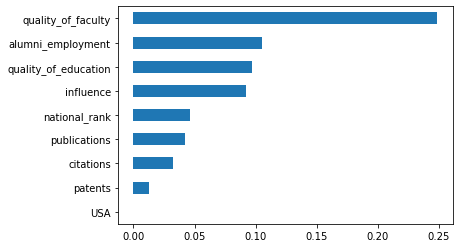

In [25]:
importances['imp_mean'].tail(10).plot(kind='barh')
plt.show()

**Partial Dependence Plots**

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <AxesSubplot:>, 'pdp_ax': <AxesSubplot:xlabel='publications'>})

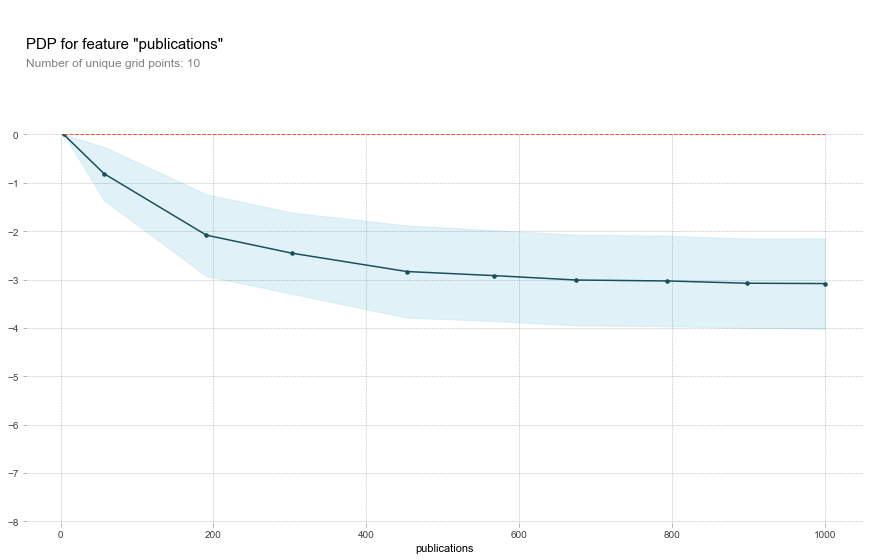

In [26]:
#Partial depence plot
feature = 'publications'
isolate = pdp_isolate(model_xgbregressor, 
                     dataset=X_val,
                     model_features=X_val.columns,
                     feature=feature)

pdp_plot(isolate, feature_name=feature)

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <AxesSubplot:>, 'pdp_ax': <AxesSubplot:xlabel='patents'>})

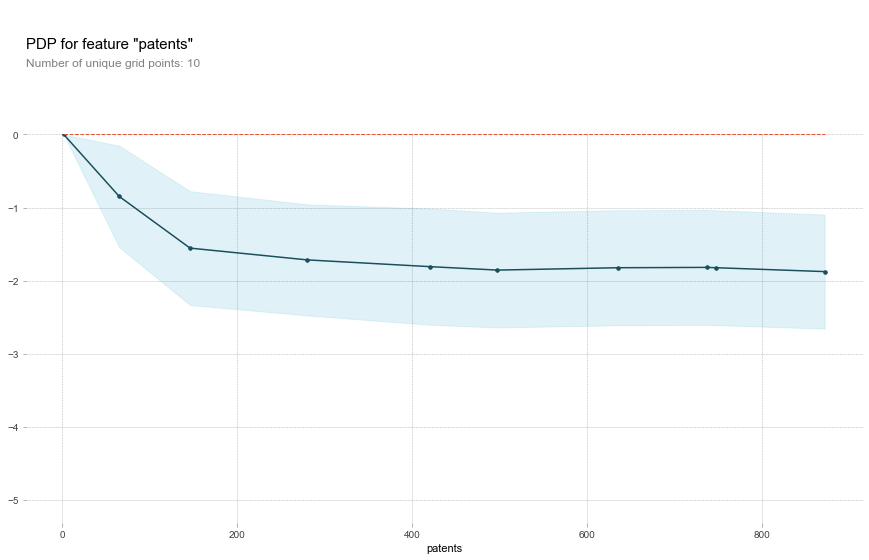

In [27]:
#Partial dependece plot
feature = 'patents'
isolate = pdp_isolate(model_xgbregressor, 
                     dataset=X_val,
                     model_features=X_val.columns,
                     feature=feature)

pdp_plot(isolate, feature_name=feature)

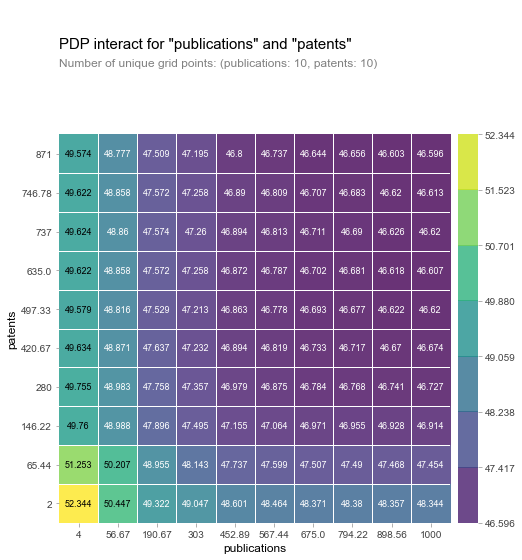

In [28]:
#Partial dependece plot; two features
features = ['publications', 'patents']
interact = pdp_interact(model_xgbregressor, 
                     dataset=X_val,
                     model_features=X_val.columns,
                     features=features)

pdp_interact_plot(interact, plot_type='grid', feature_names=features);

**Shapley Plots**

In [238]:
df.head(1)

,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,patents,score,USA
year,,,,,,,,,,
2015-01-01,96,367,334,218,200,184,136,411,46.53,1


In [239]:
X_val.head(1)

,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,patents,USA
year,,,,,,,,,
2014-01-01,42,284,478,210,832,833,609,637,0


In [45]:
#Shapley Plots
row = X_val.head(1)

explainer = shap.TreeExplainer(model_rf)
shap_values = explainer.shap_values(row)
shap_values

array([[-0.07431167, -0.19524158, -0.26524642, -0.81753452, -0.79424423,
        -1.09515139, -0.0481232 , -0.115238  , -0.00277355]])

In [46]:
shap_df = pd.DataFrame(data=shap_values[0], index=X_val.columns, columns=['shap_value'])

In [47]:
shap_df['shap_value'].sum()

-3.4078645624999897

In [52]:
shap.initjs()
shap.force_plot(
                base_value=explainer.expected_value,
                shap_values=shap_values,
                features=row)

**Shapley Plot for Harvard University 2012**

In [33]:
number1_world_ranking = df[df['score'] == 100]

In [34]:
number1_world_ranking

,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,patents,score,USA
year,,,,,,,,,,
2013-01-01,1,1,1,1,1,1,1,7,100.0,1
2015-01-01,1,1,1,1,1,1,1,3,100.0,1
2012-01-01,1,7,9,1,1,1,1,5,100.0,1
2014-01-01,1,1,1,1,1,1,1,2,100.0,1


In [36]:
harvard = number1_world_ranking[2:-1]

In [37]:
harvard

,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,patents,score,USA
year,,,,,,,,,,
2012-01-01,1,7,9,1,1,1,1,5,100.0,1


In [58]:
row = harvard

explainer = shap.TreeExplainer(model_rf)
shap_values2 = explainer.shap_values(harvard)
shap_values2

array([[6.09492916e-01, 4.99558844e+00, 7.04102257e+00, 2.68562671e+01,
        3.21363241e+00, 6.13390445e+00, 1.32243386e+00, 1.01045928e+00,
        8.73437356e-03, 0.00000000e+00]])

In [59]:
shap_df2 = pd.DataFrame(data=shap_values2[0], index=number1_world_ranking.columns, columns=['shap_value'])

In [60]:
shap_df2['shap_value'].sum()

51.19153543749947

In [61]:
shap.initjs()
shap.force_plot(
                base_value=explainer.expected_value,
                shap_values=shap_values2,
                features=harvard)

**Shapley Summary Plot**

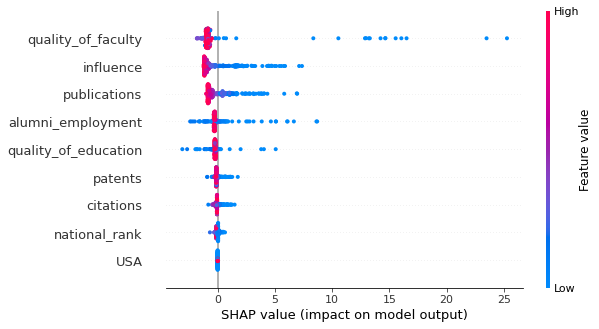

In [56]:
shap_values2 = explainer.shap_values(X_val) 
shap.summary_plot(shap_values2, X_val)